In [39]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from pathlib import Path

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF

from scipy.ndimage import distance_transform_edt, label, gaussian_filter
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from skimage.measure import regionprops

import random

In [13]:
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

device = 'mps'
print(f"Using device: {device}")

Using device: mps


In [14]:
training_data = [
    {
        'image': 'u-net/images/cropped_img1.png',  
        'mask': 'u-net/images/cropped_mask1.png', 
    },
    {
        'image': 'u-net/images/cropped_img2.png',
        'mask': 'u-net/images/cropped_mask2.png',
    }
]

In [15]:
testing_data = [
    'u-net/images/cropped_img1.png',  
    'u-net/images/cropped_img2.png',  
    'u-net/images/cropped_unseen1.png',  
    'u-net/images/rocks4.jpg',  
    'u-net/images/unseen_img2.png'
]

In [16]:
patch_size = 256
batch_size = 4
learning_rate = 0.001
patches_per_image = 30
aug = 3
epochs = 20
pos_weight = 5.0

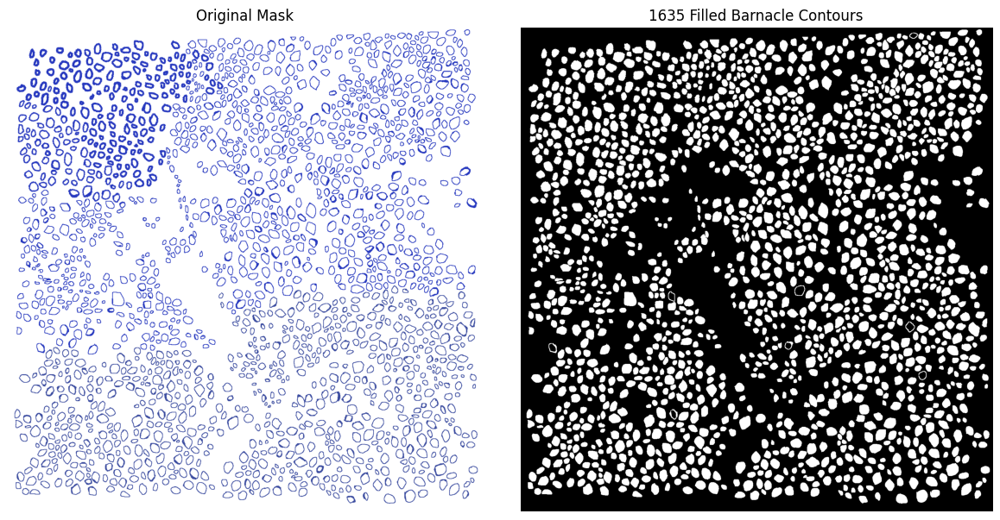

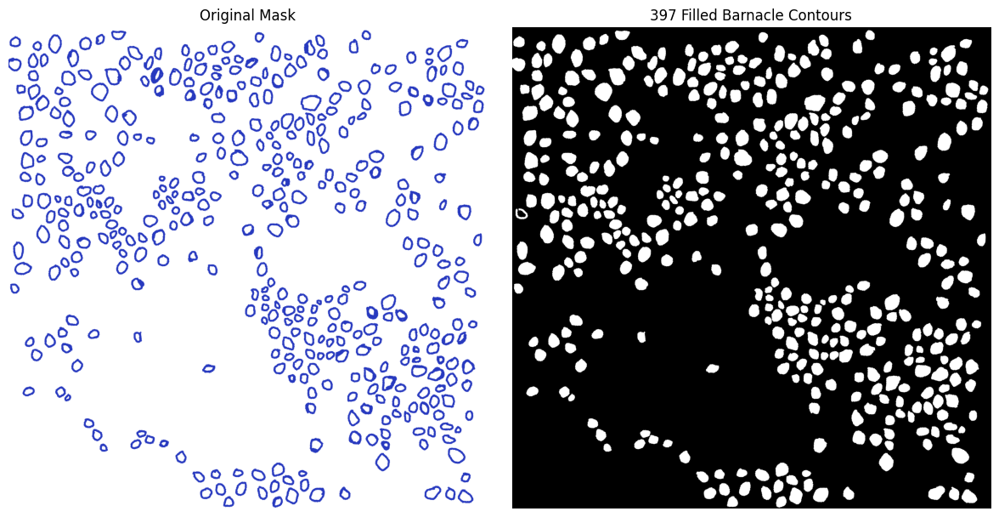

In [17]:
images = []
labels = [] 

for d in training_data: 
    img = cv.imread(d['image'], cv.IMREAD_GRAYSCALE)
    mask = cv.imread(d['mask'], cv.IMREAD_COLOR)
    gray = cv.cvtColor(mask, cv.COLOR_BGR2GRAY)
    _, thresh = cv.threshold(gray, 240, 255, cv.THRESH_BINARY_INV)
    contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    valid_contours = []
    for cnt in contours:
        area = cv.contourArea(cnt)
        if 100 < area < 5000:
            valid_contours.append(cnt)

    filled = np.zeros(gray.shape, dtype=np.uint8)
    cv.drawContours(filled, valid_contours, -1, 255, -1)


    base, ext = os.path.splitext(d['mask'])
    out_path = f"{base}_filled{ext}"
    cv.imwrite(out_path, filled)


    barnacles = []
    for contour in valid_contours:
        area = cv.contourArea(contour)
        
        individual_mask = np.zeros(gray.shape, dtype=np.uint8)
        cv.drawContours(individual_mask, [contour], -1, 255, -1)

        M = cv.moments(contour)
        if M['m00'] > 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])

            barnacles.append({
                'centroid': (cx, cy),
                'mask': individual_mask,
                'area': area,
                'contour': contour
            })
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
    axes[0].set_title("Original Mask")
    axes[0].axis("off")

    axes[1].imshow(filled, cmap="gray")
    axes[1].set_title(f"{(len(barnacles))} Filled Barnacle Contours")
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

    label_img = np.zeros(img.shape, dtype=np.uint16)
    
    for idx, barnacle in enumerate(barnacles, start=1):
        contour = barnacle['contour']
        cv.drawContours(label_img, [contour], -1, idx, -1)
    
    images.append(img)
    labels.append(label_img)

In [18]:
training_data = [
    {
        'image': 'u-net/images/cropped_img1.png',  
        'mask': 'u-net/images/cropped_mask1.png', 
        'filled': 'u-net/images/cropped_mask1_filled.png'
    },
    {
        'image': 'u-net/images/cropped_img2.png',
        'mask': 'u-net/images/cropped_mask2.png',
        'filled': 'u-net/images/cropped_mask2_filled.png'
    }
]

In [19]:
class BarnacleDataset(Dataset):
    
    def __init__(self, images, labels, patch_size=256, 
                 patches_per_image=100, augmentations_per_patch=5):
        self.patch_size = patch_size
        self.augmentations_per_patch = augmentations_per_patch
        self.base_patches = []
        
        for img, label_img in zip(images, labels):
            img_norm = img.astype(np.float32) / 255.0
            mask_binary = (label_img > 0).astype(np.float32)
            
            barnacle_pct = mask_binary.sum() / mask_binary.size * 100
            print(f"Image: {barnacle_pct:.1f}% barnacles")
            
            h, w = img_norm.shape
            extracted = 0
            
            for _ in range(patches_per_image * 3):
                if extracted >= patches_per_image:
                    break
                
                if h > patch_size and w > patch_size:
                    top = np.random.randint(0, h - patch_size)
                    left = np.random.randint(0, w - patch_size)
                    
                    img_patch = img_norm[top:top+patch_size, left:left+patch_size]
                    mask_patch = mask_binary[top:top+patch_size, left:left+patch_size]
                    
                    if mask_patch.sum() == 0:
                        self.base_patches.append({
                            'image': img_patch.copy(),
                            'mask': mask_patch.copy()
                        })
                        extracted += 1
                    elif mask_patch.sum() > 100:
                        self.base_patches.append({
                            'image': img_patch.copy(),
                            'mask': mask_patch.copy()
                        })
                        extracted += 1
            
            print(f"  Extracted {extracted} patches")
        
        print(f"\nTotal patches: {len(self.base_patches)}")

    
    def __len__(self):
        return len(self.base_patches) * self.augmentations_per_patch
    
    def augment(self, image, mask):
        image = torch.FloatTensor(image).unsqueeze(0)
        mask = torch.FloatTensor(mask).unsqueeze(0)

        if random.random() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)
        
        if random.random() > 0.5:
            image = TF.vflip(image)
            mask = TF.vflip(mask)
        
        angle = random.choice([0, 90, 180, 270])
        if angle > 0:
            image = TF.rotate(image, angle)
            mask = TF.rotate(mask, angle)
            
        if random.random() > 0.5:
            image = image * random.uniform(0.7, 1.3)
            image = torch.clamp(image, 0, 1)
        
        return image, mask
    
    def __getitem__(self, idx):
        base_idx = idx % len(self.base_patches)
        patch = self.base_patches[base_idx]
        
        image = patch['image'].copy()
        mask = patch['mask'].copy()
        
        image, mask = self.augment(image, mask)
        
        return image, mask


In [20]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super().__init__()
        
        # Encoder (downsampling)
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        
        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)
        
        # Decoder (upsampling)
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        
        # Final output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
    
    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)
        
        e2 = self.enc2(p1)
        p2 = self.pool2(e2)
        
        e3 = self.enc3(p2)
        p3 = self.pool3(e3)
        
        e4 = self.enc4(p3)
        p4 = self.pool4(e4)
        
        # Bottleneck
        b = self.bottleneck(p4)
        
        # Decoder with skip connections
        u4 = self.up4(b)
        u4 = torch.cat([u4, e4], dim=1)
        d4 = self.dec4(u4)
        
        u3 = self.up3(d4)
        u3 = torch.cat([u3, e3], dim=1)
        d3 = self.dec3(u3)
        
        u2 = self.up2(d3)
        u2 = torch.cat([u2, e2], dim=1)
        d2 = self.dec2(u2)
        
        u1 = self.up1(d2)
        u1 = torch.cat([u1, e1], dim=1)
        d1 = self.dec1(u1)
        
        # Output (raw logits)
        out = self.out(d1)
        return out

In [21]:
train_dataset = BarnacleDataset(
    images,
    labels,
    patch_size=patch_size,
    patches_per_image=patches_per_image,
    augmentations_per_patch=aug,
)

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0
)

print(f"\nDataLoader created with {len(train_loader)} batches per epoch")

Image: 30.2% barnacles
  Extracted 30 patches
Image: 17.3% barnacles
  Extracted 30 patches

Total patches: 60

DataLoader created with 45 batches per epoch


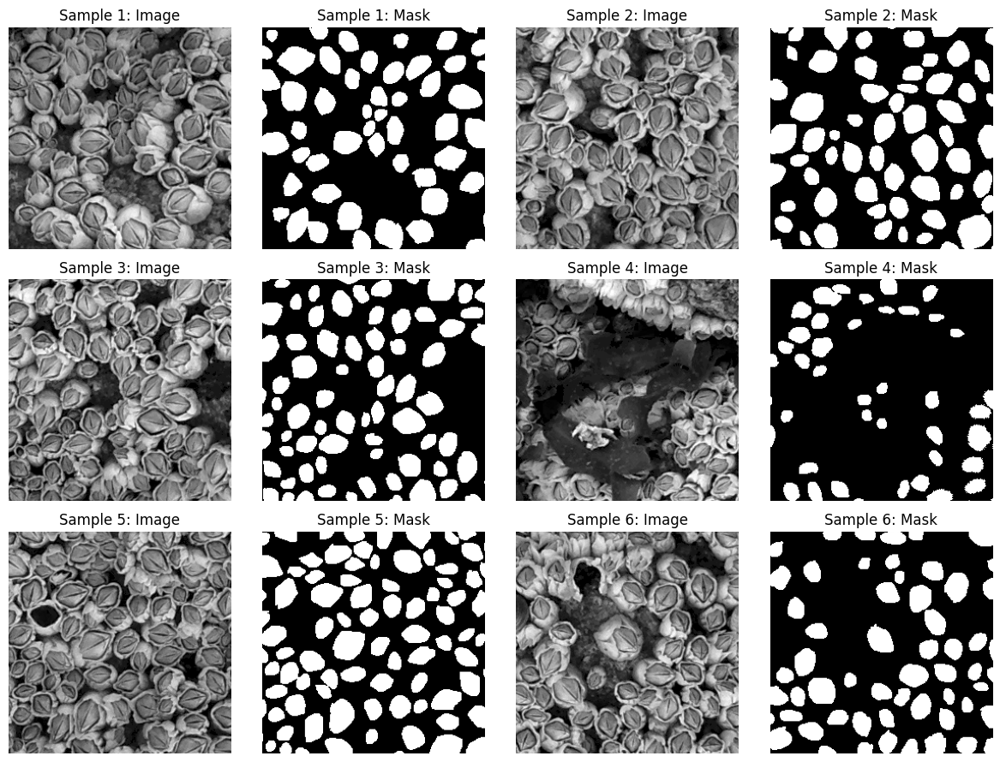

In [22]:
fig, axes = plt.subplots(3, 4, figsize=(12, 9))

for i in range(6):
    img, mask = train_dataset[i]
    
    row = i // 2
    col = (i % 2) * 2
    
    axes[row, col].imshow(img[0].numpy(), cmap='gray')
    axes[row, col].set_title(f'Sample {i+1}: Image')
    axes[row, col].axis('off')
    
    axes[row, col+1].imshow(mask[0].numpy(), cmap='gray')
    axes[row, col+1].set_title(f'Sample {i+1}: Mask')
    axes[row, col+1].axis('off')

plt.tight_layout()
plt.show()

In [23]:
model = UNet(in_channels=1, out_channels=1).to(device)

total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

Total parameters: 31,036,481


In [24]:
criterion = nn.BCEWithLogitsLoss(
    pos_weight=torch.tensor(pos_weight, device=device)
)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=10)

print(f"Loss: Weighted BCE with pos_weight={pos_weight}")
print(f"Optimizer: Adam with lr={learning_rate}")

Loss: Weighted BCE with pos_weight=5.0
Optimizer: Adam with lr=0.001


In [25]:
losses = []
model.train()


for epoch in range(epochs):
    epoch_loss = 0
    
    for batch_idx, (images, masks) in enumerate(train_loader):
        images = images.to(device)
        masks = masks.to(device)
        
        outputs = model(images)  
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
    
    avg_loss = epoch_loss / len(train_loader)
    losses.append(avg_loss)
    scheduler.step(avg_loss)
    print(f"Epoch {epoch+1:3d}/{epochs} - Loss: {avg_loss:.6f}")


Epoch   1/20 - Loss: 0.928718
Epoch   2/20 - Loss: 0.677307
Epoch   3/20 - Loss: 0.596442
Epoch   4/20 - Loss: 0.543803
Epoch   5/20 - Loss: 0.514432
Epoch   6/20 - Loss: 0.495663
Epoch   7/20 - Loss: 0.478158
Epoch   8/20 - Loss: 0.449255
Epoch   9/20 - Loss: 0.416256
Epoch  10/20 - Loss: 0.404223
Epoch  11/20 - Loss: 0.387791
Epoch  12/20 - Loss: 0.366145
Epoch  13/20 - Loss: 0.370422
Epoch  14/20 - Loss: 0.381682
Epoch  15/20 - Loss: 0.373942
Epoch  16/20 - Loss: 0.357343
Epoch  17/20 - Loss: 0.338958
Epoch  18/20 - Loss: 0.335689
Epoch  19/20 - Loss: 0.322139
Epoch  20/20 - Loss: 0.337941


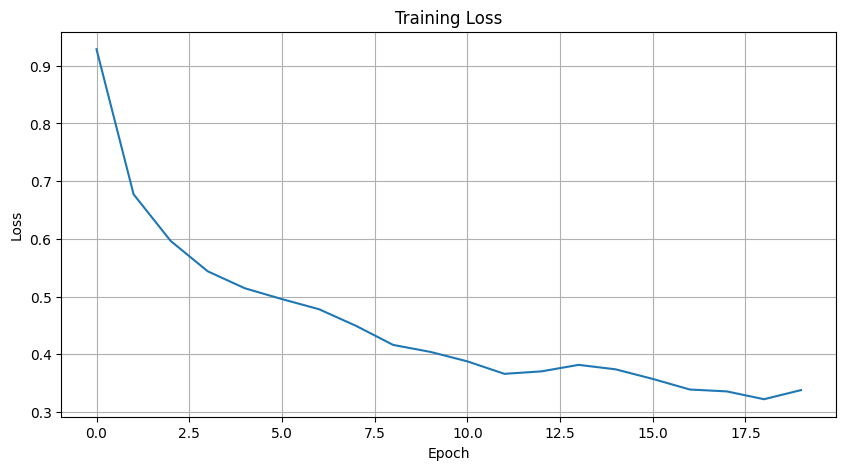

Initial loss: 0.928718
Final loss: 0.337941
Reduction: 63.6%


In [26]:
plt.figure(figsize=(10, 5))
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.grid(True)
plt.show()

print(f"Initial loss: {losses[0]:.6f}")
print(f"Final loss: {losses[-1]:.6f}")
print(f"Reduction: {(1 - losses[-1]/losses[0])*100:.1f}%")

In [27]:
def separate_instances(mask, min_area=100, max_area=2000, min_distance=12):
    
    mask_binary = (mask > 0.5).astype(np.uint8)
    
    if mask_binary.sum() == 0:
        return np.zeros_like(mask_binary, dtype=np.uint16)
    distance = distance_transform_edt(mask_binary)
    distance_smooth = gaussian_filter(distance, sigma=2.0)
    coords = peak_local_max(distance_smooth, min_distance=min_distance, labels=mask_binary)
    
    if len(coords) == 0:
        return np.zeros_like(mask_binary, dtype=np.uint16)
    
    markers = np.zeros(mask_binary.shape, dtype=bool)
    markers[tuple(coords.T)] = True
    markers = label(markers)[0]
    labels_ws = watershed(-distance, markers, mask=mask_binary)
    props = regionprops(labels_ws)
    filtered = np.zeros_like(labels_ws, dtype=np.uint16)
    new_label = 1
    
    for prop in props:
        if min_area <= prop.area <= max_area:
            filtered[labels_ws == prop.label] = new_label
            new_label += 1
    
    print(f"Found {filtered.max()} barnacles")
    return filtered

Found 1685 barnacles


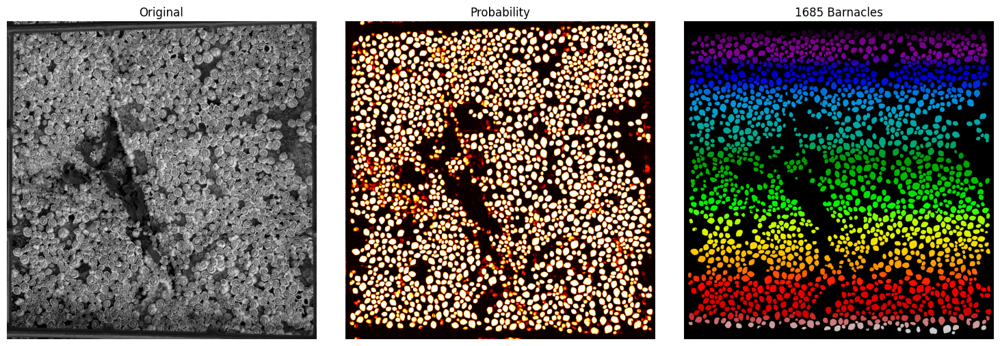

Found 455 barnacles


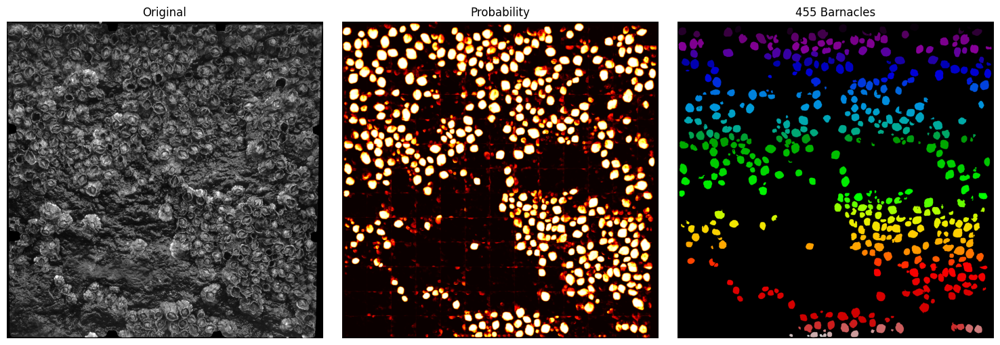

Found 1227 barnacles


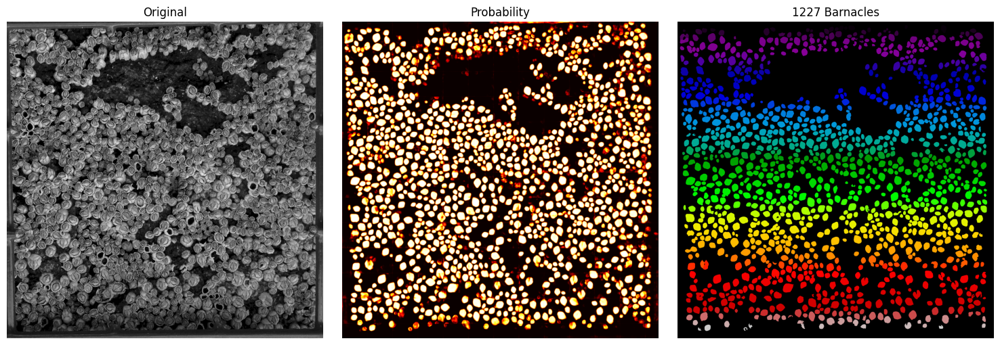

Found 68 barnacles


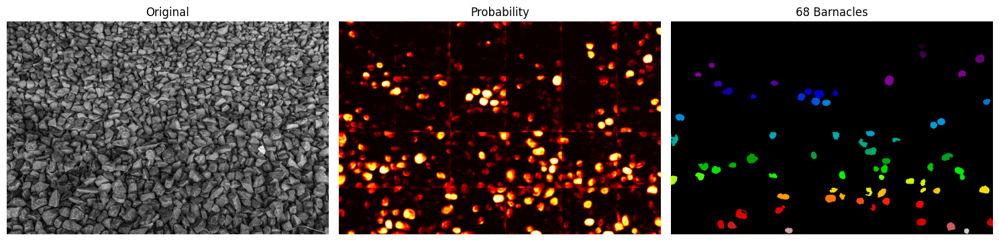

Found 129 barnacles


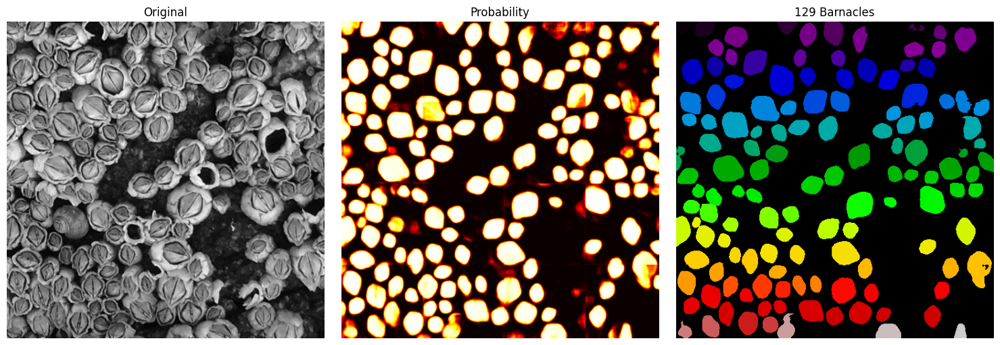

In [28]:
model.eval()

for img_path in testing_data:
    img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
    img_norm = img.astype(np.float32) / 255.0
    h, w = img.shape

    patch_size = patch_size
    stride = 128 
    prediction = np.zeros((h, w), dtype=np.float32)
    counts = np.zeros((h, w), dtype=np.float32)

    with torch.no_grad():
        for top in range(0, h, stride):
            for left in range(0, w, stride):
                bottom = min(top + patch_size, h)
                right = min(left + patch_size, w)
                
                patch = img_norm[top:bottom, left:right]
                if patch.shape[0] < patch_size or patch.shape[1] < patch_size:
                    pad_h = patch_size - patch.shape[0]
                    pad_w = patch_size - patch.shape[1]
                    patch = np.pad(patch, ((0, pad_h), (0, pad_w)), mode='reflect')
                patch_tensor = torch.FloatTensor(patch).unsqueeze(0).unsqueeze(0).to('mps')
                output = model(patch_tensor)
                pred = torch.sigmoid(output).cpu().numpy()[0, 0]
                
                pred = pred[:bottom-top, :right-left]

                prediction[top:bottom, left:right] += pred
                counts[top:bottom, left:right] += 1

    # averaging overlapping predictions
    prediction = prediction / np.maximum(counts, 1)

    filled_mask = (prediction > 0.5).astype(np.uint8)
    instances = separate_instances(filled_mask, min_area=100, max_area=2000, min_distance=12)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img, cmap='gray')
    axes[0].set_title('Original')
    axes[0].axis('off')

    axes[1].imshow(prediction, cmap='hot')
    axes[1].set_title('Probability')
    axes[1].axis('off')

    axes[2].imshow(instances, cmap='nipy_spectral')
    axes[2].set_title(f'{instances.max()} Barnacles')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

In [29]:
torch.save(model.state_dict(), 'u-net/model_v1.pth')
print("Model saved to: u-net/model_v1.pth")

Model saved to: u-net/model_v1.pth


In [30]:
training_data = [
    {
        'image': 'u-net/images/cropped_img1.png',  
        'mask': 'u-net/images/cropped_mask1.png', 
        'filled': 'u-net/images/cropped_mask1_filled.png',
    },
    {
        'image': 'u-net/images/cropped_img2.png',
        'mask': 'u-net/images/cropped_mask2.png',
        'filled': 'u-net/images/cropped_mask2_filled.png',
    },
    {
        'image': 'u-net/negs/rocks1.jpg',  
        'mask': None,
        'filled': None,
    },
]

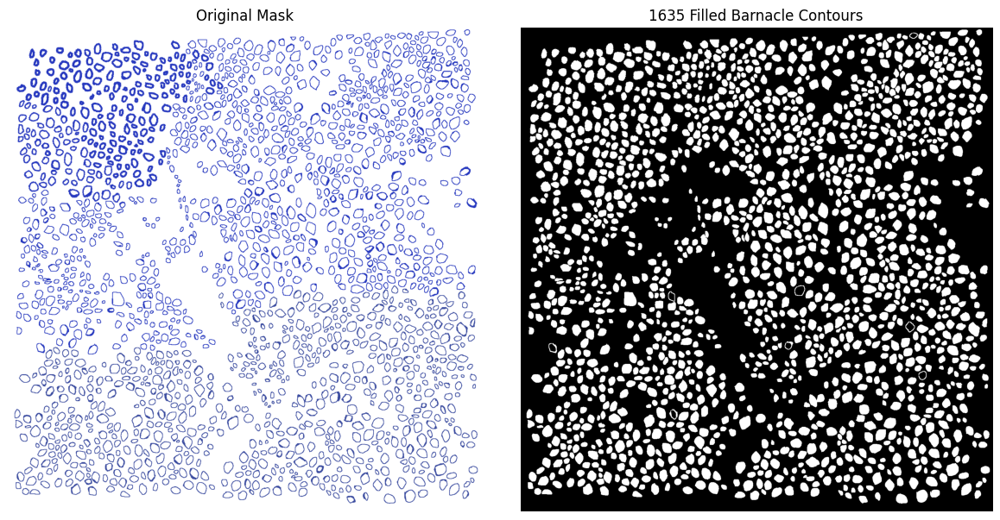

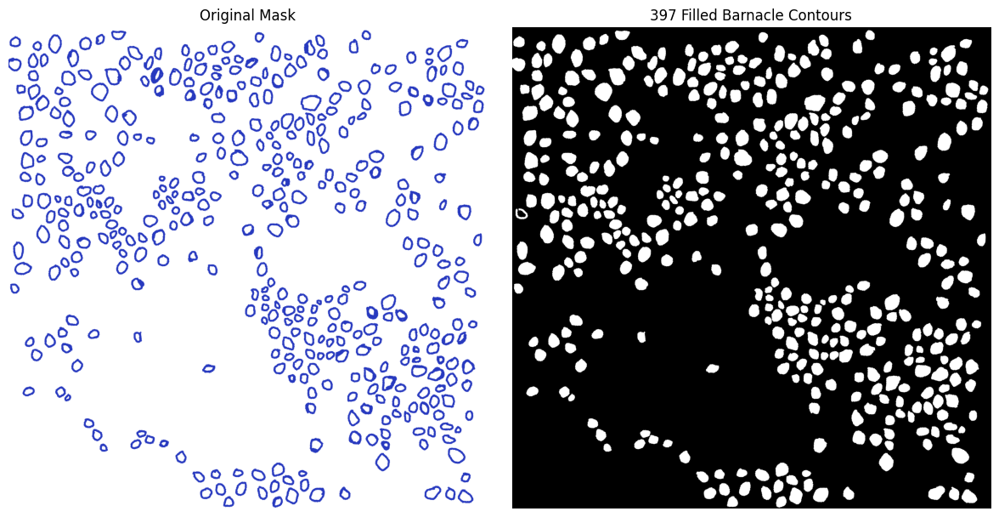

In [31]:
images = []
labels = [] 

for d in training_data: 
    img = cv.imread(d['image'], cv.IMREAD_GRAYSCALE)

    if d['mask'] is None:
        label_img = np.zeros_like(img, dtype=np.float32)
    else:
        mask = cv.imread(d['mask'], cv.IMREAD_COLOR)
        gray = cv.cvtColor(mask, cv.COLOR_BGR2GRAY)
        _, thresh = cv.threshold(gray, 240, 255, cv.THRESH_BINARY_INV)
        contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

        valid_contours = []
        for cnt in contours:
            area = cv.contourArea(cnt)
            if 100 < area < 5000:
                valid_contours.append(cnt)

        filled = np.zeros(gray.shape, dtype=np.uint8)
        cv.drawContours(filled, valid_contours, -1, 255, -1)


        base, ext = os.path.splitext(d['mask'])
        out_path = f"{base}_filled{ext}"
        cv.imwrite(out_path, filled)


        barnacles = []
        for contour in valid_contours:
            area = cv.contourArea(contour)
            
            individual_mask = np.zeros(gray.shape, dtype=np.uint8)
            cv.drawContours(individual_mask, [contour], -1, 255, -1)

            M = cv.moments(contour)
            if M['m00'] > 0:
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])

                barnacles.append({
                    'centroid': (cx, cy),
                    'mask': individual_mask,
                    'area': area,
                    'contour': contour
                })
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(cv.cvtColor(mask, cv.COLOR_BGR2RGB))
        axes[0].set_title("Original Mask")
        axes[0].axis("off")

        axes[1].imshow(filled, cmap="gray")
        axes[1].set_title(f"{(len(barnacles))} Filled Barnacle Contours")
        axes[1].axis("off")
        
        plt.tight_layout()
        plt.show()

        label_img = np.zeros(img.shape, dtype=np.uint16)
        
        for idx, barnacle in enumerate(barnacles, start=1):
            contour = barnacle['contour']
            cv.drawContours(label_img, [contour], -1, idx, -1)
        
    images.append(img)
    labels.append(label_img)

In [32]:
train_dataset_w_negs = BarnacleDataset(
    images,
    labels,
    patch_size=patch_size,
    patches_per_image=patches_per_image,
    augmentations_per_patch=aug,
)

train_loader_w_negs = DataLoader(
    train_dataset_w_negs,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0
)

print(f"\nDataLoader created with {len(train_loader_w_negs)} batches per epoch")

Image: 30.2% barnacles
  Extracted 30 patches
Image: 17.3% barnacles
  Extracted 30 patches
Image: 0.0% barnacles
  Extracted 30 patches

Total patches: 90

DataLoader created with 68 batches per epoch


In [33]:
model_v2 = UNet(in_channels=1, out_channels=1).to(device)

total_params_v2 = sum(p.numel() for p in model_v2.parameters())
print(f"Total parameters: {total_params_v2:,}")

Total parameters: 31,036,481


In [34]:
criterion_v2 = nn.BCEWithLogitsLoss(
    pos_weight=torch.tensor(pos_weight, device=device)
)
optimizer_v2 = torch.optim.Adam(model_v2.parameters(), lr=learning_rate)
scheduler_v2 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v2, mode='min', factor=0.5, patience=10)

print(f"Loss: Weighted BCE with pos_weight={pos_weight}")
print(f"Optimizer: Adam with lr={learning_rate}")
losses_v2 = []

Loss: Weighted BCE with pos_weight=5.0
Optimizer: Adam with lr=0.001


In [35]:
model_v2.train()

for epoch in range(epochs):
    epoch_loss = 0
    
    for batch_idx, (images, masks) in enumerate(train_loader_w_negs):
        images = images.to(device)
        masks = masks.to(device)

        outputs = model_v2(images)
        loss = criterion_v2(outputs, masks)
        optimizer_v2.zero_grad()
        loss.backward()
        optimizer_v2.step()
        
        epoch_loss += loss.item()
    
    avg_loss = epoch_loss / len(train_loader_w_negs)
    losses_v2.append(avg_loss)
    scheduler_v2.step(avg_loss)
    print(f"Epoch {epoch+1:3d}/{epochs} - Loss: {avg_loss:.6f}")

Epoch   1/20 - Loss: 0.986632
Epoch   2/20 - Loss: 0.925065
Epoch   3/20 - Loss: 0.833580
Epoch   4/20 - Loss: 0.838783
Epoch   5/20 - Loss: 0.756871
Epoch   6/20 - Loss: 0.798538
Epoch   7/20 - Loss: 0.687440
Epoch   8/20 - Loss: 0.657272
Epoch   9/20 - Loss: 0.592869
Epoch  10/20 - Loss: 0.506657
Epoch  11/20 - Loss: 0.497132
Epoch  12/20 - Loss: 0.498385
Epoch  13/20 - Loss: 0.440667
Epoch  14/20 - Loss: 0.396652
Epoch  15/20 - Loss: 0.405460
Epoch  16/20 - Loss: 0.367919
Epoch  17/20 - Loss: 0.340834
Epoch  18/20 - Loss: 0.321547
Epoch  19/20 - Loss: 0.388688
Epoch  20/20 - Loss: 0.316639


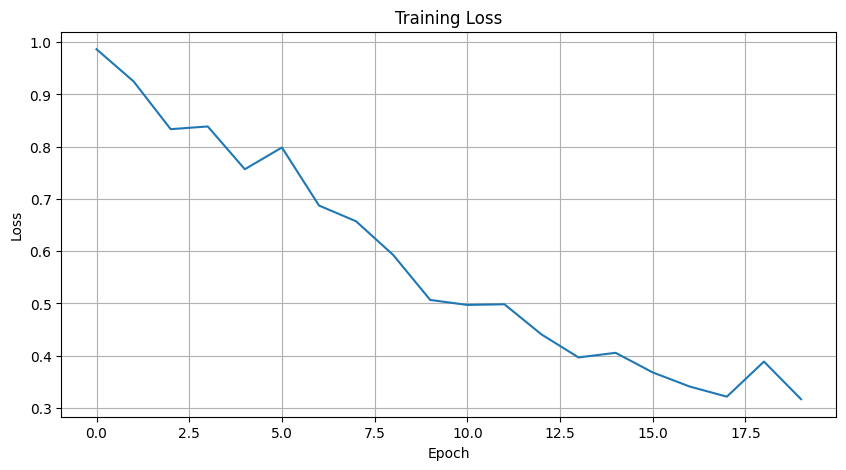

Initial loss: 0.986632
Final loss: 0.316639
Reduction: 67.9%


In [36]:
plt.figure(figsize=(10, 5))
plt.plot(losses_v2)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.grid(True)
plt.show()

print(f"Initial loss: {losses_v2[0]:.6f}")
print(f"Final loss: {losses_v2[-1]:.6f}")
print(f"Reduction: {(1 - losses_v2[-1]/losses_v2[0])*100:.1f}%")

Found 1590 barnacles


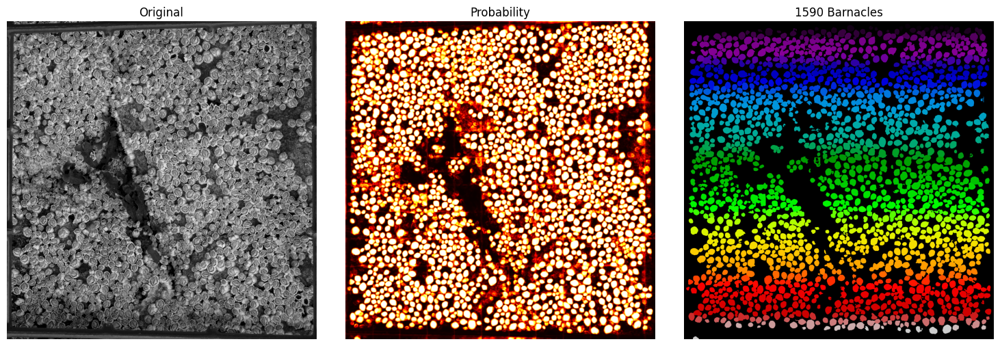

Found 606 barnacles


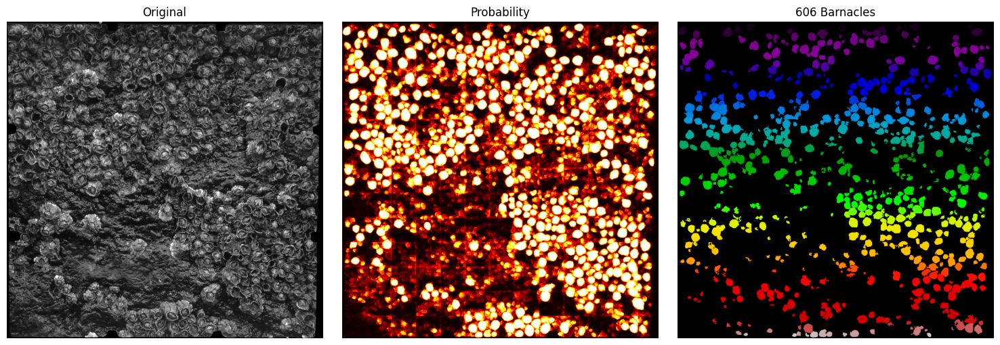

Found 1161 barnacles


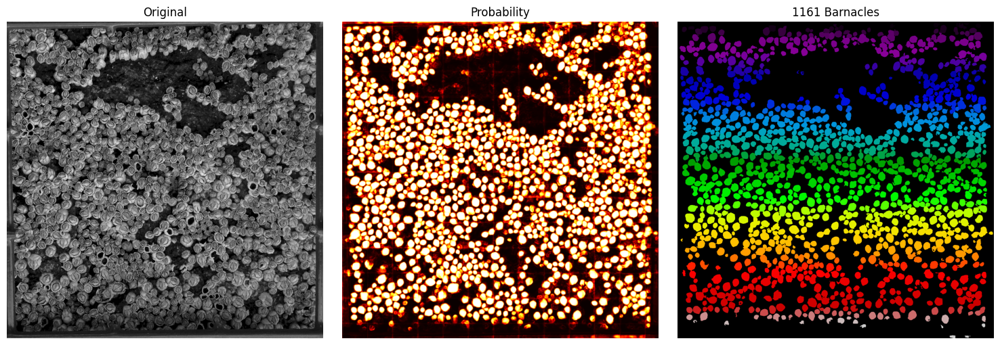

Found 28 barnacles


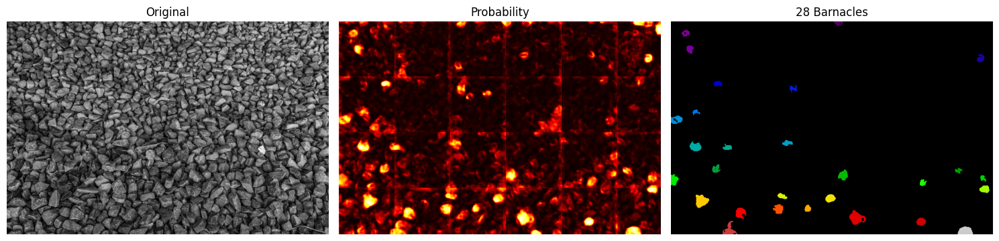

Found 129 barnacles


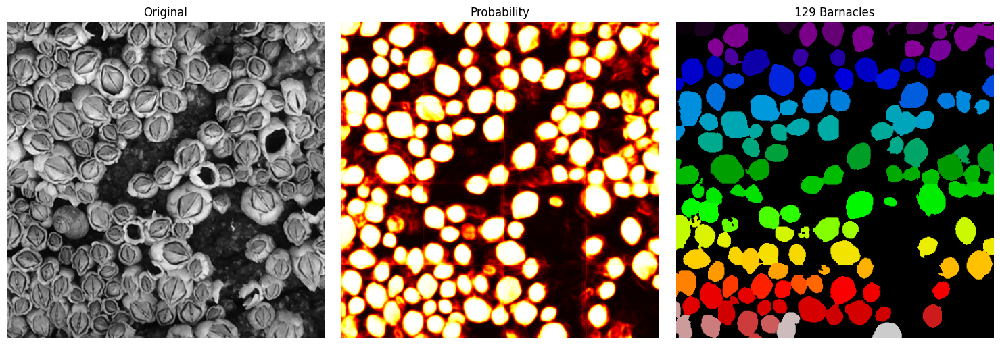

In [37]:
model_v2.eval()

for img_path in testing_data:
    img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
    img_norm = img.astype(np.float32) / 255.0
    h, w = img.shape

    patch_size = patch_size
    stride = 128 
    prediction = np.zeros((h, w), dtype=np.float32)
    counts = np.zeros((h, w), dtype=np.float32)

    with torch.no_grad():
        for top in range(0, h, stride):
            for left in range(0, w, stride):
                bottom = min(top + patch_size, h)
                right = min(left + patch_size, w)
                
                patch = img_norm[top:bottom, left:right]
                if patch.shape[0] < patch_size or patch.shape[1] < patch_size:
                    pad_h = patch_size - patch.shape[0]
                    pad_w = patch_size - patch.shape[1]
                    patch = np.pad(patch, ((0, pad_h), (0, pad_w)), mode='reflect')
                patch_tensor = torch.FloatTensor(patch).unsqueeze(0).unsqueeze(0).to('mps')
                output = model_v2(patch_tensor)
                pred = torch.sigmoid(output).cpu().numpy()[0, 0]
                
                pred = pred[:bottom-top, :right-left]

                prediction[top:bottom, left:right] += pred
                counts[top:bottom, left:right] += 1

    # averaging overlapping predictions
    prediction = prediction / np.maximum(counts, 1)

    filled_mask = (prediction > 0.5).astype(np.uint8)
    instances = separate_instances(filled_mask, min_area=100, max_area=2000, min_distance=12)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img, cmap='gray')
    axes[0].set_title('Original')
    axes[0].axis('off')

    axes[1].imshow(prediction, cmap='hot')
    axes[1].set_title('Probability')
    axes[1].axis('off')

    axes[2].imshow(instances, cmap='nipy_spectral')
    axes[2].set_title(f'{instances.max()} Barnacles')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

In [38]:
torch.save(model_v2.state_dict(), 'u-net/model_v2.pth')
print("Model saved to: u-net/model_v2.pth")

Model saved to: u-net/model_v2.pth
